baseline.ipynb<br>
.. └  models<br>
.. └  data<br>
.... ├ train_input_img<br>
.... ├ train_label_img<br>
.... ├ test_input_img<br>
.... ├ sample_submission<br>
.... ├ train.csv<br>
.... └ test.csv<br>

## 사용 패키지

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
from tqdm import tqdm
from glob import glob
import gc
import cv2
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
import math
import zipfile

## 데이터

In [48]:
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/MyDrive/Project/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
train_csv = pd.read_csv(drive_path+'data/train.csv')
test_csv = pd.read_csv(drive_path +'data/test.csv')

In [4]:
train_csv.head()

,img_id,input_img,label_img
0,10000,train_input_10000.png,train_label_10000.png
1,10001,train_input_10001.png,train_label_10001.png
2,10002,train_input_10002.png,train_label_10002.png
3,10003,train_input_10003.png,train_label_10003.png
4,10004,train_input_10004.png,train_label_10004.png


In [5]:
test_csv.head()

,img_id,input_img,submission_name
0,20000,test_input_20000.png,test_20000.png
1,20001,test_input_20001.png,test_20001.png
2,20002,test_input_20002.png,test_20002.png
3,20003,test_input_20003.png,test_20003.png
4,20004,test_input_20004.png,test_20004.png


In [6]:
train_all_input_files = drive_path+'data/train_input_img/'+train_csv['input_img']
train_all_label_files = drive_path+'data/train_label_img/'+train_csv['label_img']
test_all_label_files = drive_path+'data/test_input_img/'+test_csv['input_img']

In [7]:
def resize_img(img_path_list, save_path, size):

    os.makedirs(f'{save_path}_resize', exist_ok=True)
    num = 0
    for path in tqdm(img_path_list):
        img_name = path.split('/')[2]
        img = cv2.imread(path)
        img = cv2.resize(img,(size,size), interpolation=cv2.INTER_AREA)
        cv2.imwrite(f'{save_path}_resize/{img_name}', img)
        num+=1

In [ ]:
# resize_img(train_all_input_files, 'data/train_input_img', 512)
# resize_img(train_all_label_files, 'data/train_label_img', 512)
# resize_img(test_all_label_files, 'data/test_input_img', 512)

100%|██████████| 20/20 [00:03<00:00,  6.39it/s]


In [8]:
train_all_input_files = drive_path+'data/train_input_img_resize/'+train_csv['input_img']
train_all_label_files = drive_path+'data/train_label_img_resize/'+train_csv['label_img']
test_all_label_files = drive_path+'data/test_input_img_resize/'+test_csv['input_img']

In [9]:
len(train_all_input_files), len(train_all_label_files), len(test_all_label_files)

(622, 622, 20)

In [10]:
train_all_input_files[0], train_all_label_files[0], test_all_label_files[0]

('/content/drive/MyDrive/Project/data/train_input_img_resize/train_input_10000.png',
 '/content/drive/MyDrive/Project/data/train_label_img_resize/train_label_10000.png',
 '/content/drive/MyDrive/Project/data/test_input_img_resize/test_input_20000.png')

In [11]:
train_input_files = train_all_input_files[60:].to_numpy()
train_label_files = train_all_label_files[60:].to_numpy()

val_input_files = train_all_input_files[:60].to_numpy()
val_label_files = train_all_label_files[:60].to_numpy()

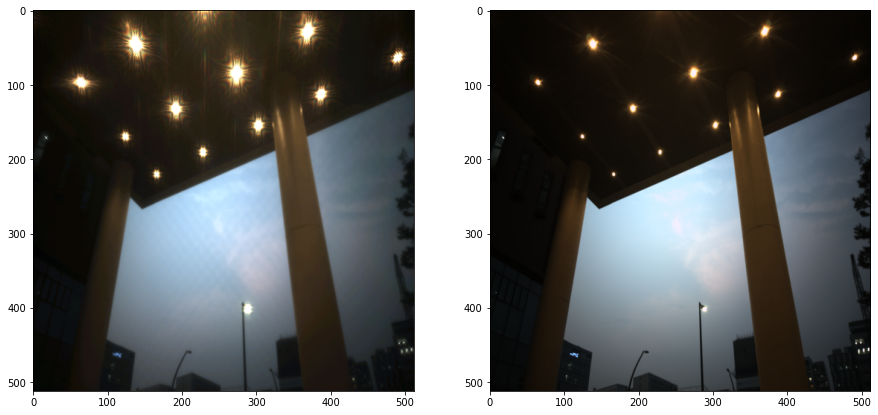

/content/drive/MyDrive/Project/data/train_input_img_resize/train_input_10060.png /content/drive/MyDrive/Project/data/train_label_img_resize/train_label_10060.png 



In [12]:
for input_path, label_path in zip(train_input_files, train_label_files):
    inp_img = cv2.imread(input_path)
    targ_img = cv2.imread(label_path)
    plt.figure(figsize=(15,10))
    inp_img = cv2.cvtColor(inp_img, cv2.COLOR_BGR2RGB)
    targ_img = cv2.cvtColor(targ_img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1)
    plt.imshow(inp_img)
    plt.subplot(1,2,2)
    plt.imshow(targ_img)
    plt.show()
    print(input_path, label_path, '\n')
    break

## 하이퍼파라미터

In [13]:
# BATCH_SIZE = 8
# img_size = 256
# #weights = None
# weights = 'imagenet'
# learning_rate = 1e-5
# EPOCHS = 5
# dropout_rate = 0.1

BATCH_SIZE = 8
img_size = 128
#weights = None
weights = 'imagenet'
learning_rate = 1e-5
EPOCHS = 7
dropout_rate = 0.1

## 전처리

이미지를 슬라이딩하며 256x256으로 잘라 데이터셋 구성

In [14]:
def cut_img(img_path_list, save_path, stride):
    os.makedirs(f'{save_path}{img_size}', exist_ok=True)
    num = 0
    for path in tqdm(img_path_list):
        img = cv2.imread(path)
        for top in range(0, img.shape[0], stride):
            for left in range(0, img.shape[1], stride):
                piece = np.zeros([img_size, img_size, 3], np.uint8)
                temp = img[top:top+img_size, left:left+img_size, :]
                piece[:temp.shape[0], :temp.shape[1], :] = temp
                np.save(f'{save_path}{img_size}/{num}.npy', piece)
                num+=1

In [15]:
cut_img(train_input_files, 'data/train_input_img_resize', 64)
cut_img(train_label_files, 'data/train_label_img_resize', 64)
cut_img(val_input_files, 'data/val_input_img_resize', 64)
cut_img(val_label_files, 'data/val_label_img_resize', 64)

100%|██████████| 60/60 [00:42<00:00,  1.41it/s]


In [16]:
train_inp_files = glob(f'data/train_input_img_resize{img_size}/*.npy')
train_targ_files = glob(f'data/train_label_img_resize{img_size}/*.npy')

val_inp_files = glob(f'data/val_input_img_resize{img_size}/*.npy')
val_targ_files = glob(f'data/val_label_img_resize{img_size}/*.npy')

In [ ]:
# train_inp_files = glob(drive_path+f'data/train_input_img_resize{img_size}/*.npy')
# train_targ_files = glob(drive_path+f'data/train_label_img_resize{img_size}/*.npy')

# val_inp_files = glob(drive_path+f'data/val_input_img_resize{img_size}/*.npy')
# val_targ_files = glob(drive_path+f'data/val_label_img_resize{img_size}/*.npy')

In [17]:
train_inp_files, train_targ_files = shuffle(train_inp_files, train_targ_files, random_state=42)

In [18]:
len(train_inp_files), len(val_inp_files), len(train_targ_files), len(val_targ_files), 

(35968, 3840, 35968, 3840)

## 데이터셋

0 ~ 255를 0~1로 정규화한 데이터셋 구성

augmentation : rotate, flip

In [19]:
def train_map_func(inp_path, targ_path):
    inp = np.load(inp_path)
    inp = inp.astype(np.float32)/255
    targ = np.load(targ_path)
    targ = targ.astype(np.float32)/255
    inp, targ = augmentation(inp, targ)
    
    return inp, targ

def val_map_func(inp_path, targ_path):
    inp = np.load(inp_path)
    inp = inp.astype(np.float32)/255
    targ = np.load(targ_path)
    targ = targ.astype(np.float32)/255
    return inp, targ

def augmentation(inp, targ):
    inp, targ = random_rot(inp, targ)
    inp, targ = random_flip(inp, targ)
    
    return inp, targ

def random_rot(inp, targ):
    k = np.random.randint(4)
    inp = np.rot90(inp, k)
    targ = np.rot90(targ, k)
    
    return inp, targ

def random_flip(inp, targ):
    f = np.random.randint(2)
    if f == 0:
        inp = np.fliplr(inp)
        targ = np.fliplr(targ)
        
    return inp, targ

In [20]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_inp_files, train_targ_files))
train_dataset = train_dataset.map(lambda item1, item2: tf.numpy_function(train_map_func, [item1, item2], [tf.float32, tf.float32]), num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((val_inp_files, val_targ_files))
val_dataset = val_dataset.map(lambda item1, item2: tf.numpy_function(val_map_func, [item1, item2], [tf.float32, tf.float32]), num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [21]:
next(iter(train_dataset))[0].shape, next(iter(train_dataset))[1].shape, next(iter(val_dataset))[0].shape, next(iter(val_dataset))[1].shape

(TensorShape([8, 128, 128, 3]),
 TensorShape([8, 128, 128, 3]),
 TensorShape([8, 128, 128, 3]),
 TensorShape([8, 128, 128, 3]))

## 모델

ResNet101V2를 backbone으로 사용한 Unet

In [22]:
def convolution_block(x, filters, size, strides=(1,1), padding='same', activation=True):
    x = tf.keras.layers.Conv2D(filters, size, strides=strides, padding=padding)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    if activation == True:
        x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
    return x

def residual_block(blockInput, num_filters=16):
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(blockInput)
    x = tf.keras.layers.BatchNormalization()(x)
    blockInput = tf.keras.layers.BatchNormalization()(blockInput)
    x = convolution_block(x, num_filters, (3,3) )
    x = convolution_block(x, num_filters, (3,3), activation=False)
    x = tf.keras.layers.Add()([x, blockInput])
    return x

In [23]:
def ResUNet101V2(input_shape=(None, None, 3), dropout_rate=0.1, start_neurons = 16):
    backbone = tf.keras.applications.ResNet101V2(weights=weights, include_top=False, input_shape=input_shape)
    input_layer = backbone.input
    
    conv4 = backbone.layers[122].output
    conv4 = tf.keras.layers.LeakyReLU(alpha=0.1)(conv4)
    pool4 = tf.keras.layers.MaxPooling2D((2, 2))(conv4)
    pool4 = tf.keras.layers.Dropout(dropout_rate)(pool4)
    
    convm = tf.keras.layers.Conv2D(start_neurons * 32, (3, 3), activation=None, padding="same")(pool4)
    convm = residual_block(convm,start_neurons * 32)
    convm = residual_block(convm,start_neurons * 32)
    convm = tf.keras.layers.LeakyReLU(alpha=0.1)(convm)
    
    deconv4 = tf.keras.layers.Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = tf.keras.layers.concatenate([deconv4, conv4])
    uconv4 = tf.keras.layers.Dropout(dropout_rate)(uconv4)
    
    uconv4 = tf.keras.layers.Conv2D(start_neurons * 16, (3, 3), activation=None, padding="same")(uconv4)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = tf.keras.layers.LeakyReLU(alpha=0.1)(uconv4)
    
    deconv3 = tf.keras.layers.Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    conv3 = backbone.layers[76].output
    uconv3 = tf.keras.layers.concatenate([deconv3, conv3])    
    uconv3 = tf.keras.layers.Dropout(dropout_rate)(uconv3)
    
    uconv3 = tf.keras.layers.Conv2D(start_neurons * 8, (3, 3), activation=None, padding="same")(uconv3)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = tf.keras.layers.LeakyReLU(alpha=0.1)(uconv3)

    deconv2 = tf.keras.layers.Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    conv2 = backbone.layers[30].output
    uconv2 = tf.keras.layers.concatenate([deconv2, conv2])
        
    uconv2 = tf.keras.layers.Dropout(0.1)(uconv2)
    uconv2 = tf.keras.layers.Conv2D(start_neurons * 4, (3, 3), activation=None, padding="same")(uconv2)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = tf.keras.layers.LeakyReLU(alpha=0.1)(uconv2)
    
    deconv1 = tf.keras.layers.Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv2)
    conv1 = backbone.layers[2].output
    uconv1 = tf.keras.layers.concatenate([deconv1, conv1])
    
    uconv1 = tf.keras.layers.Dropout(0.1)(uconv1)
    uconv1 = tf.keras.layers.Conv2D(start_neurons * 2, (3, 3), activation=None, padding="same")(uconv1)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = tf.keras.layers.LeakyReLU(alpha=0.1)(uconv1)
    
    uconv0 = tf.keras.layers.Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv1)   
    uconv0 = tf.keras.layers.Dropout(0.1)(uconv0)
    uconv0 = tf.keras.layers.Conv2D(start_neurons * 1, (3, 3), activation=None, padding="same")(uconv0)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = tf.keras.layers.LeakyReLU(alpha=0.1)(uconv0)
    
    uconv0 = tf.keras.layers.Dropout(dropout_rate/2)(uconv0)
    output_layer = tf.keras.layers.Conv2D(3, (1,1), padding="same", activation="sigmoid")(uconv0)    
    
    model = tf.keras.models.Model(input_layer, output_layer)

    return model

## 모델 및 옵티마이저 선언

In [24]:
optimizer = tf.keras.optimizers.Adam(learning_rate)
model = ResUNet101V2(input_shape=(img_size, img_size, 3),dropout_rate=dropout_rate)
model.compile(loss='mae', optimizer=optimizer)

171319296/171317808 [==============================] - 4s 0us/step


## 콜백 정의 및 학습

In [25]:
callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath = drive_path+'models/baseline_model.h5',
        monitor='val_loss',
        save_best_only=True
    )
]

In [26]:
hist = model.fit(train_dataset, epochs=EPOCHS, validation_data=val_dataset, callbacks=callbacks_list)

Epoch 1/7
4496/4496 [==============================] - 1058s 227ms/step - loss: 0.1954 - val_loss: 0.1252


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/7
4496/4496 [==============================] - 1011s 225ms/step - loss: 0.1184 - val_loss: 0.0848
Epoch 3/7
4496/4496 [==============================] - 1011s 225ms/step - loss: 0.0836 - val_loss: 0.0700
Epoch 4/7
4496/4496 [==============================] - 1011s 225ms/step - loss: 0.0630 - val_loss: 0.0562
Epoch 5/7
4496/4496 [==============================] - 1012s 225ms/step - loss: 0.0513 - val_loss: 0.0488
Epoch 6/7
4496/4496 [==============================] - 1009s 225ms/step - loss: 0.0446 - val_loss: 0.0464
Epoch 7/7
4496/4496 [==============================] - 1007s 224ms/step - loss: 0.0404 - val_loss: 0.0434


## 학습 결과

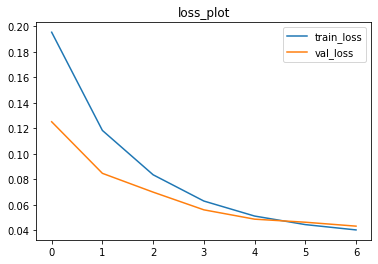

In [27]:
plt.plot(hist.history["loss"], label='train_loss')
plt.plot(hist.history["val_loss"], label='val_loss')
plt.title('loss_plot')
plt.legend()
plt.show()

## 베스트 모델 복원

In [28]:
model = tf.keras.models.load_model(drive_path+'models/baseline_model.h5')

## 추론 함수 정의

In [29]:
def predict(img_paths, stride=32, batch_size=128):
    results = []
    for img_path in img_paths:
        img = cv2.imread(img_path)
        img = img.astype(np.float32)/255
        crop = []
        position = []
        batch_count = 0

        result_img = np.zeros_like(img)
        voting_mask = np.zeros_like(img)

        for top in tqdm(range(0, img.shape[0], stride)):
            for left in range(0, img.shape[1], stride):
                piece = np.zeros([img_size, img_size, 3], np.float32)
                temp = img[top:top+img_size, left:left+img_size, :]
                piece[:temp.shape[0], :temp.shape[1], :] = temp
                crop.append(piece)
                position.append([top, left])
                batch_count += 1
                if batch_count == batch_size:
                    crop = np.array(crop)
                    pred = model(crop)*255
                    crop = []
                    batch_count = 0
                    for num, (t, l) in enumerate(position):
                        piece = pred[num]
                        h, w, c = result_img[t:t+img_size, l:l+img_size, :].shape
                        result_img[t:t+img_size, l:l+img_size, :] += piece[:h, :w]
                        voting_mask[t:t+img_size, l:l+img_size, :] += 1
                    position = []
        
        result_img = result_img/voting_mask
        result_img = result_img.astype(np.uint8)
        results.append(result_img)
        
    return results

In [30]:
def rmse_score(true, pred):
    score = math.sqrt(np.mean((true-pred)**2))
    return score

def psnr_score(true, pred, pixel_max):
    score = 20*np.log10(pixel_max/rmse_score(true, pred))
    return score

## ValidationSet 결과

In [65]:
result = predict(val_input_files[:5], 32)

100%|██████████| 16/16 [00:01<00:00,  9.38it/s]


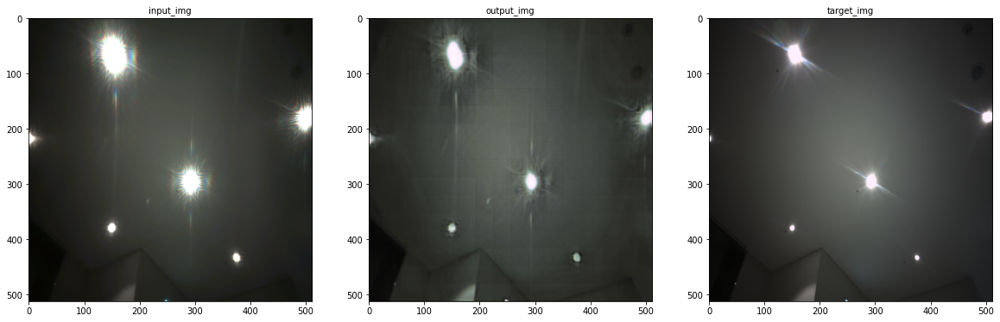

input PSNR : 29.111184018114997
output PSNR : 32.31238213880717 



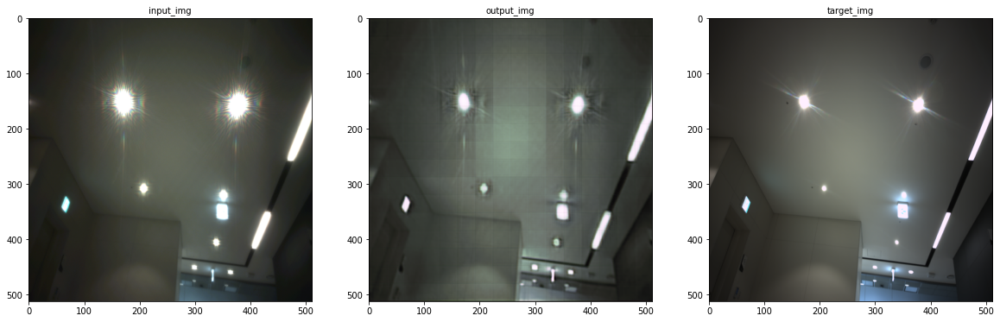

input PSNR : 28.673425067865928
output PSNR : 30.649201634019583 



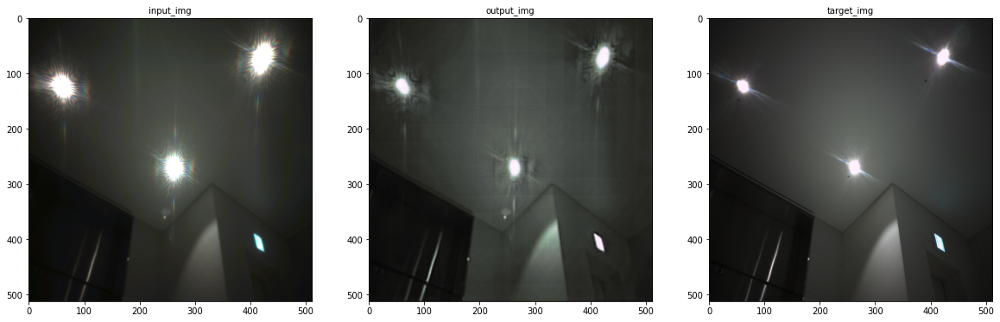

input PSNR : 29.60322023481271
output PSNR : 32.95008952333632 



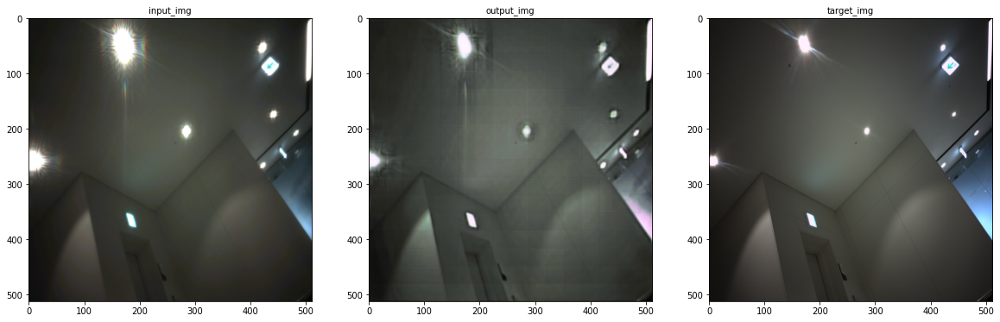

input PSNR : 29.133230347093825
output PSNR : 31.0270589660962 



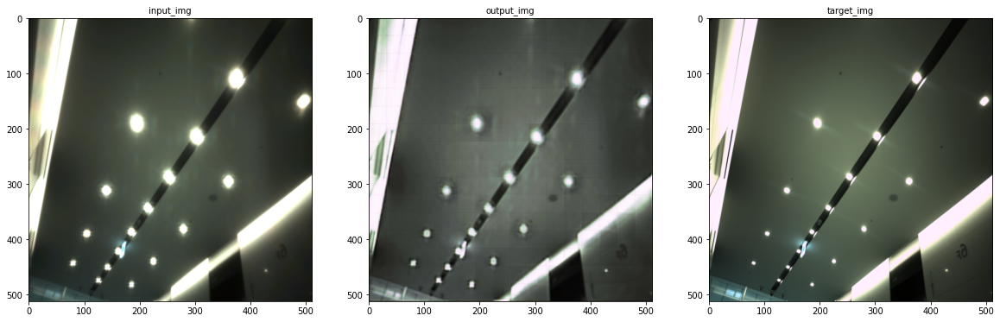

input PSNR : 28.933621291089015
output PSNR : 30.103031221644407 



In [66]:
for i, (input_path, label_path) in enumerate(zip(val_input_files[:5], val_label_files[:5])):
    input_img = cv2.imread(input_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    targ_img = cv2.imread(label_path)
    targ_img = cv2.cvtColor(targ_img, cv2.COLOR_BGR2RGB)
    pred_img = result[i]
    pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1)
    plt.imshow(input_img)
    plt.title('input_img', fontsize=10)
    plt.subplot(1,3,2)
    plt.imshow(pred_img)
    plt.title('output_img', fontsize=10)
    plt.subplot(1,3,3)
    plt.imshow(targ_img)
    plt.title('target_img', fontsize=10)
    plt.show()
    print('input PSNR :', psnr_score(input_img, targ_img, 255))
    print('output PSNR :', psnr_score(result[i], targ_img, 255), '\n')

## TestSet 추론

In [33]:
test_input_files = drive_path+'data/test_input_img_resize/'+test_csv['input_img']

In [34]:
test_result = predict(test_input_files, 32)

100%|██████████| 16/16 [00:01<00:00, 10.87it/s]


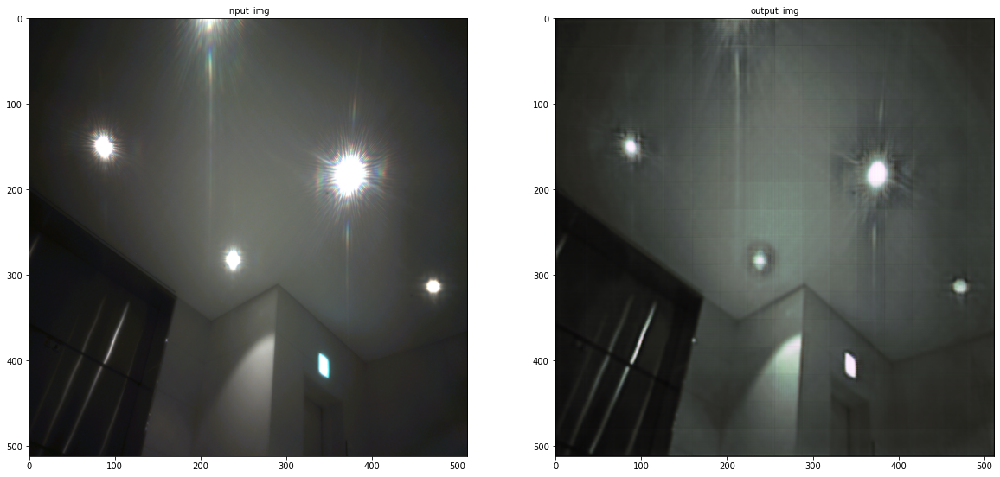

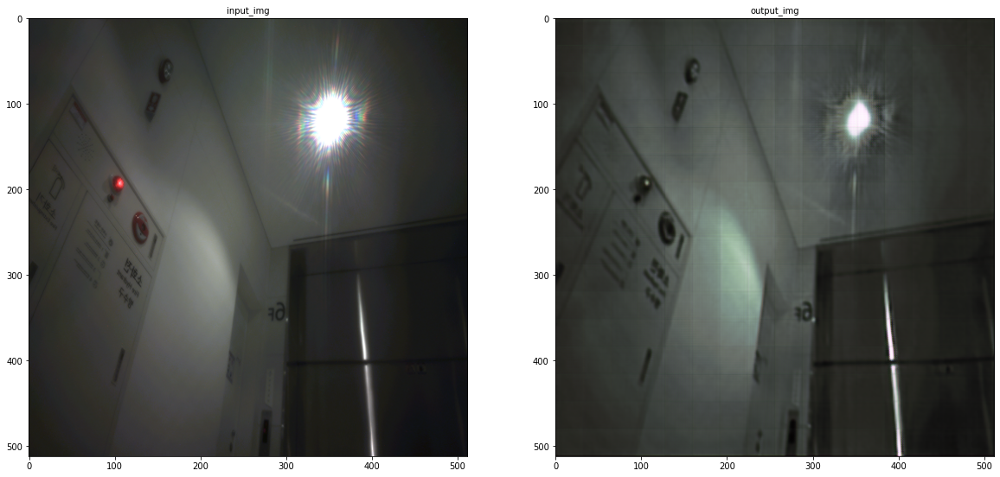

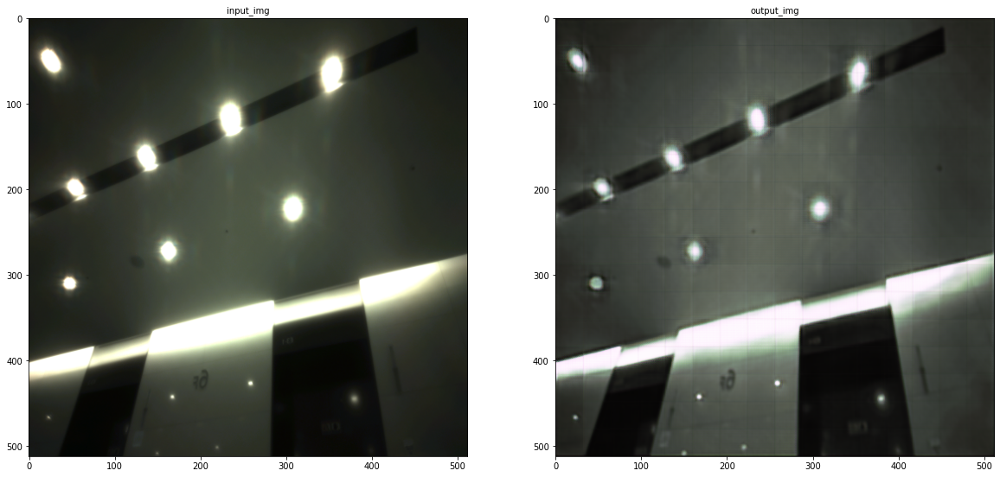

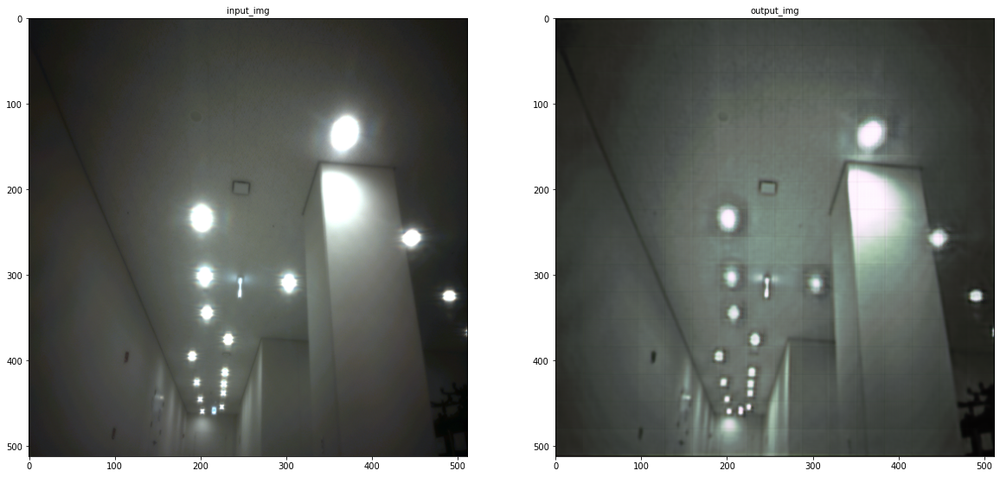

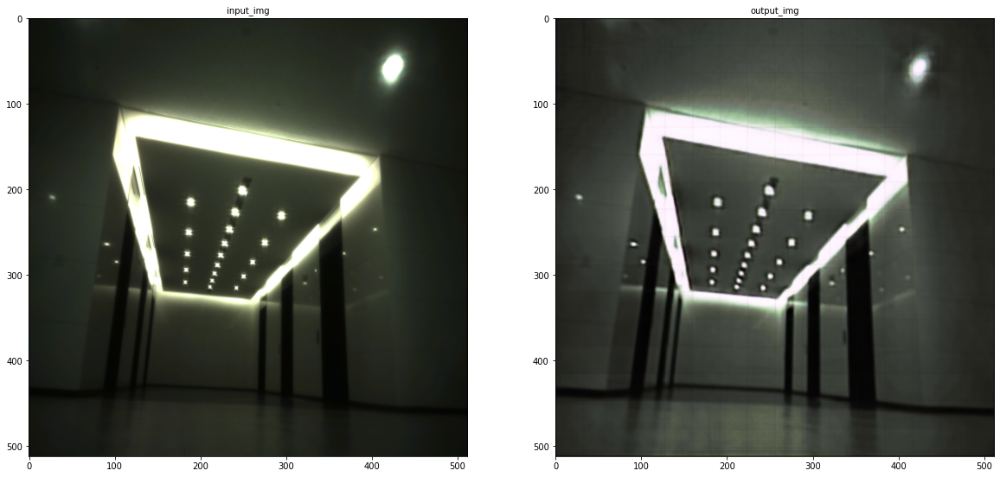

...

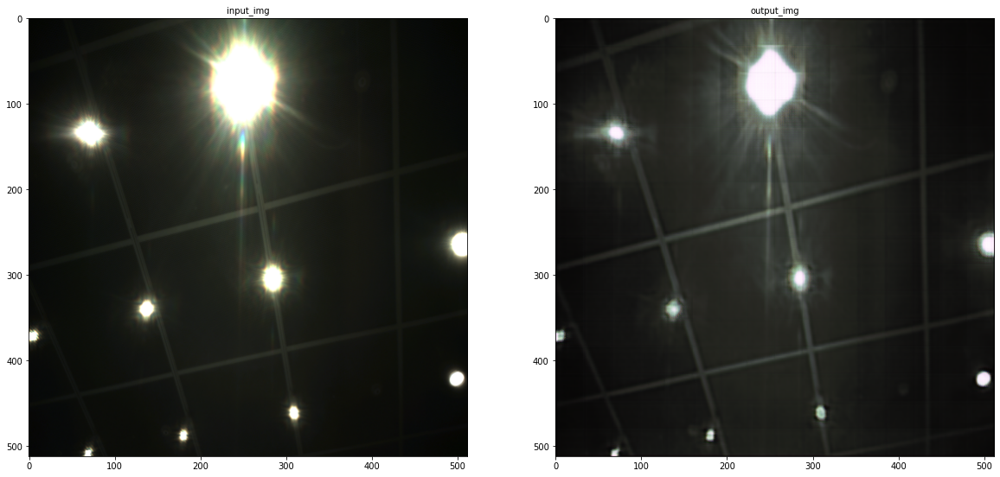

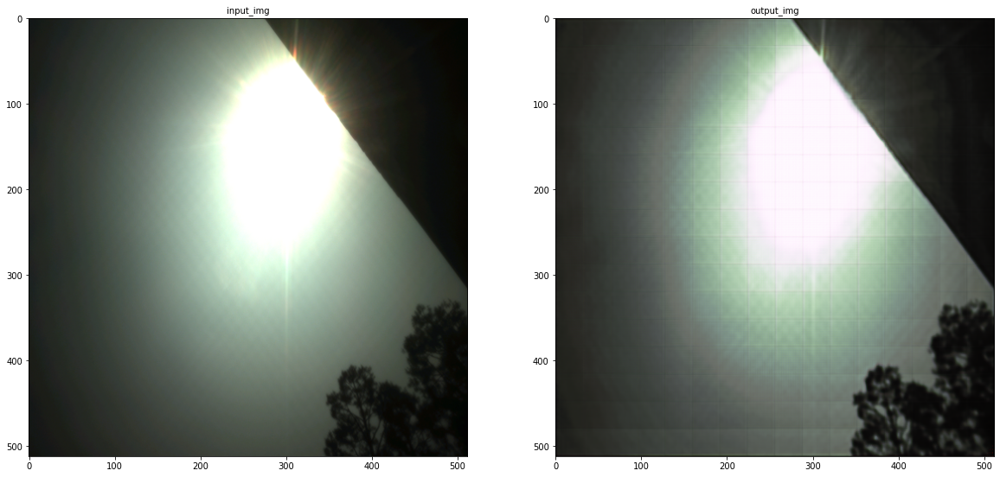

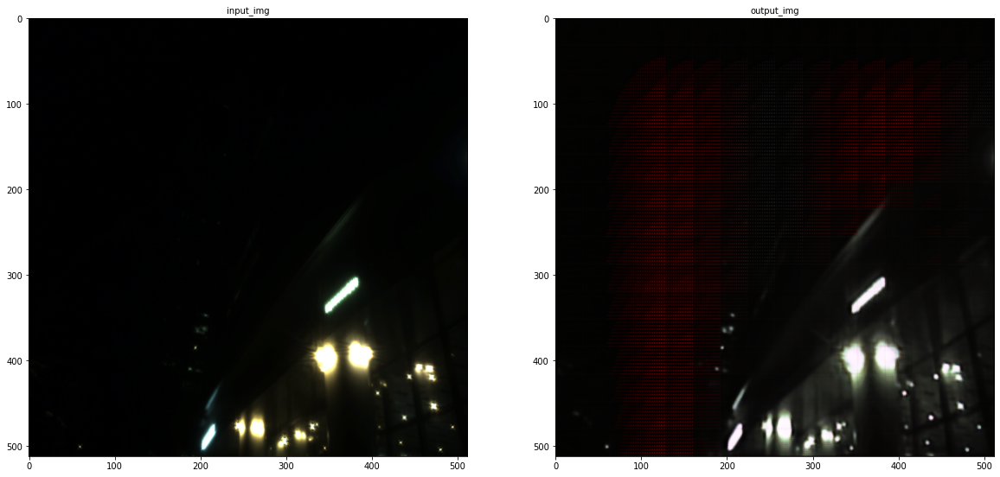

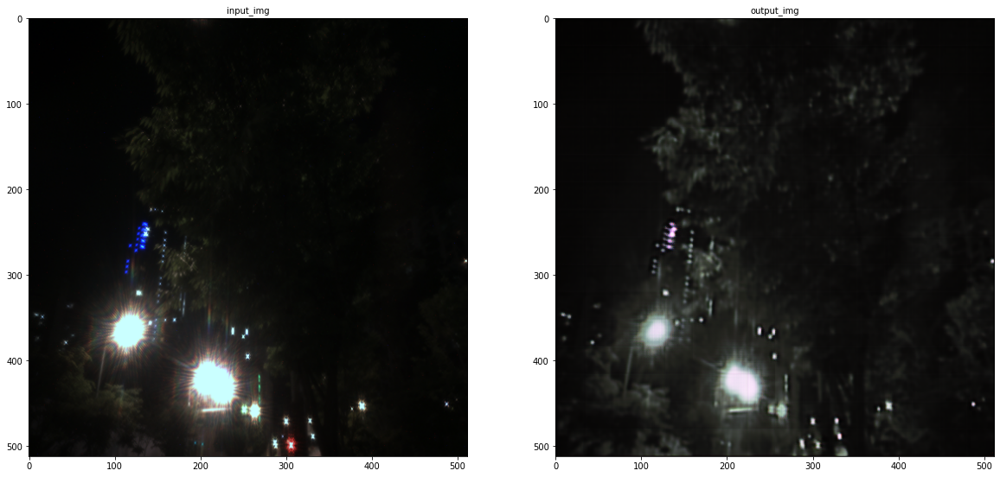

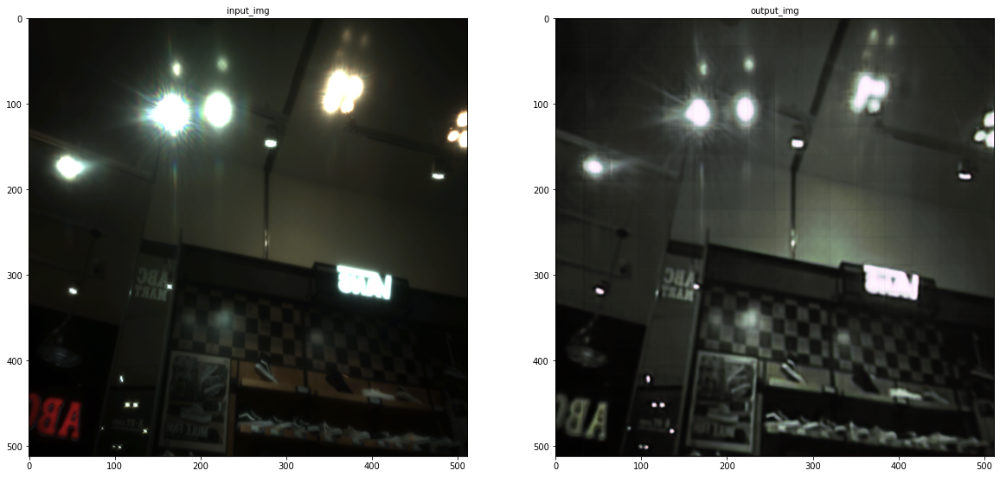

In [35]:
for i, input_path in enumerate(test_input_files):
    input_img = cv2.imread(input_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    pred_img = test_result[i]
    pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(input_img)
    plt.title('input_img', fontsize=10)
    plt.subplot(1,2,2)
    plt.imshow(pred_img)
    plt.title('output_img', fontsize=10)
    plt.show()

## 결과 제출

In [39]:
def make_submission(result):
    os.makedirs(drive_path+'/submission', exist_ok=True)
    os.chdir(drive_path+"/submission/")
    sub_imgs = []
    for i, img in enumerate(result):
        path = f'test_{20000+i}.png'
        cv2.imwrite(path, img)
        sub_imgs.append(path)
    submission = zipfile.ZipFile("submission.zip", 'w')
    for path in sub_imgs:
        submission.write(path)
    submission.close()

In [40]:
make_submission(test_result)

In [70]:
from PIL import Image
os.makedirs(drive_path+'/result/test', exist_ok=True)
os.makedirs(drive_path+'/result/train', exist_ok=True)

In [77]:
result = predict(val_input_files[:10], 32)

100%|██████████| 16/16 [00:01<00:00, 10.91it/s]


In [79]:
for i, input_path in enumerate(val_input_files[:10]):
    img_name = input_path.split('/')
    img_name = img_name[-1]
    input_img = cv2.imread(input_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    pred_img = result[i]
    pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)

    pred_img = Image.fromarray(pred_img)
    pred_img.save(drive_path+f"result/train/{img_name}")

In [80]:
test_result = predict(test_input_files, 32)

100%|██████████| 16/16 [00:01<00:00, 10.96it/s]


In [81]:
for i, input_path in enumerate(test_input_files):
    img_name = input_path.split('/')
    img_name = img_name[-1]
    input_img = cv2.imread(input_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    pred_img = test_result[i]
    pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)
    pred_img = Image.fromarray(pred_img)
    pred_img.save(drive_path+f"result/test/{img_name}")